# 3x Leveraged ETF Rebalancing Strategy

Based on Dr. Lewis A. Glenn's paper "Long-Term Investing in Triple Leveraged ETFs" (SSRN 3722318) and the [SetupAlpha Medium article](https://medium.com/@setupalpha.capital/3x-leveraged-etf-strategy-2-600-return-with-38-drawdown-trading-strategy-rules-f4dad806bc25).

## Strategy Rules:
1. **Universe**: TQQQ (3x Nasdaq-100), TMF (3x 20-Year Treasury)
2. **Allocation**: 50% TQQQ, 50% TMF
3. **Rebalancing**: Every 2 months - rebalance back to 50/50 split
4. **Crash Filter ("Black Swan Filter")**:
   - If TQQQ drops **20% or more** in a single day, exit both positions
   - Move to **cash** (or IEF in original paper)
   - Stay out until TQQQ recovers and **exceeds its pre-crash price**
   - Then return to 50/50 TQQQ/TMF

## Key Insight:
The negative correlation between tech equities and long-duration bonds creates a natural hedge that offsets beta slippage from daily leverage resets.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from pathlib import Path
from datetime import datetime, timedelta
import sys, warnings
warnings.filterwarnings('ignore')

import subprocess as _sp
PROJECT_ROOT = Path(_sp.check_output(
    "git rev-parse --show-toplevel", shell=True, text=True, cwd="."
).strip())

sys.path.insert(0, str(PROJECT_ROOT / 'signum'))
from signum import Chart, Dashboard

pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', '{:.2f}'.format)

SyntaxError: invalid syntax (3655278469.py, line 21)

## Load & Prepare Data

In [ ]:
df = pd.read_parquet(PROJECT_ROOT / 'equities' / 'triple_leveraged_etfs.parquet')
prices = df.pivot(index='date', columns='ticker', values='close').sort_index()

# IEF has full coverage; TQQQ/TMF start later — dropna aligns all three
prices = prices[['TQQQ', 'TMF', 'IEF']].dropna()

returns = prices.pct_change().dropna()
CRASH_THRESHOLD = -0.20

crash_days = returns[returns['TQQQ'] <= CRASH_THRESHOLD]
if len(crash_days) > 0:
    display(crash_days[['TQQQ', 'TMF', 'IEF']])


ticker,TQQQ,TMF
date,,
2020-03-09,-0.20,0.09
2020-03-12,-0.27,0.02
2020-03-16,-0.34,0.17


In [74]:
def calculate_metrics(portfolio_values: pd.Series, risk_free_rate: float = 0.02) -> dict:
    """Calculate key performance metrics for a portfolio equity curve."""
    daily_returns = portfolio_values.pct_change().dropna()
    years = (portfolio_values.index[-1] - portfolio_values.index[0]).days / 365.25
    total_return = portfolio_values.iloc[-1] / portfolio_values.iloc[0] - 1
    cagr = (1 + total_return) ** (1/years) - 1
    volatility = daily_returns.std() * np.sqrt(252)
    sharpe = (cagr - risk_free_rate) / volatility if volatility > 0 else 0
    downside_std = daily_returns[daily_returns < 0].std() * np.sqrt(252)
    sortino = (cagr - risk_free_rate) / downside_std if downside_std > 0 else 0
    drawdown = (portfolio_values - portfolio_values.cummax()) / portfolio_values.cummax()
    max_drawdown = drawdown.min()
    mar_ratio = abs(cagr / max_drawdown) if max_drawdown != 0 else float('inf')
    return {
        'Years': years, 'Total Return': total_return * 100, 'CAGR': cagr * 100,
        'Volatility': volatility * 100, 'Sharpe Ratio': sharpe, 'Sortino Ratio': sortino,
        'Max Drawdown': max_drawdown * 100, 'MAR Ratio': mar_ratio,
    }

---
## Part 1: Manual Strategy Implementation
50/50 TQQQ/TMF with bimonthly rebalancing and crash filter.

In [75]:
# Strategy Parameters
REBALANCE_MONTHS = 2
CRASH_THRESHOLD = -0.20
TARGET_WEIGHT_TQQQ = 0.50
TARGET_WEIGHT_TMF = 0.50
INITIAL_CAPITAL = 100_000
SLIPPAGE_PCT = 0.0025

def run_strategy(prices: pd.DataFrame, returns: pd.DataFrame) -> pd.DataFrame:
    """Run the 3x Leveraged ETF strategy with bimonthly rebalancing and crash filter.
    
    Crash filter: exit TQQQ/TMF into IEF (7-10Y Treasury ETF) when TQQQ drops >= 20%
    in a single day. Re-enter 50/50 when TQQQ recovers above pre-crash price.
    Rebalancing: last trading day of every 2nd calendar month.
    """
    dates = prices.index
    portfolio_values = []
    in_ief = False
    pre_crash_tqqq_price = None
    last_rebalance_month = None
    capital = INITIAL_CAPITAL
    shares_tqqq = shares_tmf = shares_ief = 0.0

    # Pre-compute last trading day of each month for calendar rebalancing
    month_ends = dates.to_series().groupby(dates.to_period('M')).last()
    # Build set of rebalance dates: every 2nd month-end
    rebal_months = month_ends.iloc[::REBALANCE_MONTHS].index
    rebal_dates_set = set(month_ends.loc[rebal_months].values)

    for i, date in enumerate(dates):
        tqqq_price = prices.loc[date, 'TQQQ']
        tmf_price = prices.loc[date, 'TMF']
        ief_price = prices.loc[date, 'IEF']

        # Update portfolio value
        if i > 0:
            if in_ief:
                capital = shares_ief * ief_price
            else:
                capital = shares_tqqq * tqqq_price + shares_tmf * tmf_price

        # Crash filter: exit to IEF
        if i > 0 and not in_ief:
            tqqq_ret = returns.loc[date, 'TQQQ'] if date in returns.index else 0
            if tqqq_ret <= CRASH_THRESHOLD:
                in_ief = True
                pre_crash_tqqq_price = prices.loc[dates[i-1], 'TQQQ']
                capital *= (1 - SLIPPAGE_PCT)  # slippage on exit
                shares_tqqq = shares_tmf = 0.0
                shares_ief = capital / ief_price

        # Re-entry: IEF back to 50/50 TQQQ/TMF
        if in_ief and pre_crash_tqqq_price is not None and tqqq_price > pre_crash_tqqq_price:
            capital = shares_ief * ief_price  # mark-to-market IEF
            in_ief = False
            pre_crash_tqqq_price = None
            capital *= (1 - SLIPPAGE_PCT)  # slippage on re-entry
            shares_ief = 0.0
            shares_tqqq = (capital * TARGET_WEIGHT_TQQQ) / tqqq_price
            shares_tmf = (capital * TARGET_WEIGHT_TMF) / tmf_price
            last_rebalance_month = date.to_period('M')

        # First day init
        if i == 0 and not in_ief:
            shares_tqqq = (capital * TARGET_WEIGHT_TQQQ) / tqqq_price
            shares_tmf = (capital * TARGET_WEIGHT_TMF) / tmf_price
            last_rebalance_month = date.to_period('M')

        # Calendar-based bimonthly rebalance (last trading day of every 2nd month)
        if not in_ief and date in rebal_dates_set and i > 0:
            current_period = date.to_period('M')
            if last_rebalance_month is not None and current_period != last_rebalance_month:
                total_value = shares_tqqq * tqqq_price + shares_tmf * tmf_price
                rebal_cost = abs(shares_tqqq * tqqq_price - total_value * TARGET_WEIGHT_TQQQ) * SLIPPAGE_PCT
                total_value -= rebal_cost
                shares_tqqq = (total_value * TARGET_WEIGHT_TQQQ) / tqqq_price
                shares_tmf = (total_value * TARGET_WEIGHT_TMF) / tmf_price
                capital = total_value
                last_rebalance_month = current_period

        if in_ief:
            port_value = shares_ief * ief_price
            w_tqqq, w_tmf = 0.0, 0.0
        else:
            tqqq_value = shares_tqqq * tqqq_price
            tmf_value = shares_tmf * tmf_price
            port_value = tqqq_value + tmf_value
            w_tqqq = tqqq_value / port_value if port_value > 0 else 0
            w_tmf = tmf_value / port_value if port_value > 0 else 0

        portfolio_values.append({
            'date': date, 'portfolio_value': port_value,
            'weight_tqqq': w_tqqq, 'weight_tmf': w_tmf,
            'in_cash': in_ief, 'shares_tqqq': shares_tqqq, 'shares_tmf': shares_tmf,
        })

    return pd.DataFrame(portfolio_values).set_index('date')

strategy_results = run_strategy(prices, returns)
print(f"${INITIAL_CAPITAL:,} \u2192 ${strategy_results['portfolio_value'].iloc[-1]:,.0f}  |  "
      f"{strategy_results.index.min()} \u2192 {strategy_results.index.max()}")


$100,000 â†’ $3,497,441  |  2010-02-11 00:00:00 â†’ 2026-03-03 00:00:00


### Individual Signals: TQQQ & TMF
Each asset's standalone performance — equity curve, drawdown, and key metrics.

In [76]:
# Individual Signal Performance: TQQQ & TMF Standalone
tqqq_equity = (prices['TQQQ'] / prices['TQQQ'].iloc[0]) * INITIAL_CAPITAL
tmf_equity  = (prices['TMF'] / prices['TMF'].iloc[0]) * INITIAL_CAPITAL

tqqq_rets = prices['TQQQ'].pct_change().dropna()
tmf_rets  = prices['TMF'].pct_change().dropna()

tqqq_dd = ((1 + tqqq_rets).cumprod() / (1 + tqqq_rets).cumprod().cummax() - 1) * 100
tmf_dd  = ((1 + tmf_rets).cumprod() / (1 + tmf_rets).cumprod().cummax() - 1) * 100

Dashboard(
    panes=[
        (Chart(theme='midnight', height=280)
         .line(tqqq_equity / 1e6, name='TQQQ $100K B&H', color='#2196F3', width=2)
         .line(tmf_equity / 1e6, name='TMF $100K B&H', color='#4CAF50', width=2)),
        (Chart(theme='midnight', height=150)
         .area(tqqq_dd, name='TQQQ DD%', color='rgba(33,150,243,0.3)', lineColor='#2196F3')
         .area(tmf_dd, name='TMF DD%', color='rgba(76,175,80,0.3)', lineColor='#4CAF50')),
    ],
    titles=['TQQQ & TMF Buy-Hold Equity ($M)', 'Drawdown (%)'],
    theme='midnight',
).show()

# Per-asset metrics
tqqq_m = calculate_metrics(tqqq_equity)
tmf_m = calculate_metrics(tmf_equity)
pd.DataFrame({'TQQQ (3x Nasdaq)': tqqq_m, 'TMF (3x 20Y Treasury)': tmf_m}).round(2)

,TQQQ (3x Nasdaq),TMF (3x 20Y Treasury)
Years,16.05,16.05
Total Return,22137.63,-47.88
CAGR,40.02,-3.98
Volatility,60.99,44.59
Sharpe Ratio,0.62,-0.13
Sortino Ratio,0.80,-0.20
Max Drawdown,-81.75,-93.33
MAR Ratio,0.49,0.04


### Combined Strategy: 50/50 Rebalanced + Crash Filter
Combining negatively correlated TQQQ and TMF reduces portfolio volatility and improves risk-adjusted returns.

In [77]:
# Combined Strategy vs Individual Assets
bh5050_equity = 0.5 * tqqq_equity + 0.5 * tmf_equity
strat_equity = strategy_results['portfolio_value']

bh5050_rets = bh5050_equity.pct_change().dropna()
strat_rets  = strat_equity.pct_change().dropna()

common_idx = tqqq_rets.index.intersection(tmf_rets.index).intersection(strat_rets.index)
tqqq_rets = tqqq_rets.loc[common_idx]
tmf_rets  = tmf_rets.loc[common_idx]
bh5050_rets = bh5050_rets.loc[common_idx]
strat_rets  = strat_rets.loc[common_idx]

def asset_metrics(rets, rf=0.02):
    ann_ret = (1 + rets.mean()) ** 252 - 1
    ann_vol = rets.std() * np.sqrt(252)
    sharpe  = (ann_ret - rf) / ann_vol if ann_vol > 0 else 0
    sortino_denom = rets[rets < 0].std() * np.sqrt(252)
    sortino = (ann_ret - rf) / sortino_denom if sortino_denom > 0 else 0
    cum = (1 + rets).cumprod()
    dd  = (cum / cum.cummax() - 1).min()
    return {
        'Ann. Return (%)': ann_ret * 100, 'Ann. Vol (%)': ann_vol * 100,
        'Sharpe': sharpe, 'Sortino': sortino, 'Max DD (%)': dd * 100,
        'Hit Rate (%)': (rets > 0).mean() * 100,
        'Total Return (%)': ((1 + rets).prod() - 1) * 100,
    }

metrics_table = pd.DataFrame({
    'TQQQ': asset_metrics(tqqq_rets),
    'TMF': asset_metrics(tmf_rets),
    '50/50 Buy-Hold': asset_metrics(bh5050_rets),
    'Strategy (Rebal+Filter)': asset_metrics(strat_rets),
})
metrics_table.round(2)

,TQQQ,TMF,50/50 Buy-Hold,Strategy (Rebal+Filter)
Ann. Return (%),69.04,6.07,53.56,31.38
Ann. Vol (%),60.99,44.59,51.71,31.94
Sharpe,1.10,0.09,1.00,0.92
Sortino,1.41,0.14,1.24,1.26
Max DD (%),-81.75,-93.33,-81.60,-76.77
Hit Rate (%),55.81,51.99,56.18,54.55
Total Return (%),22137.63,-47.88,11044.88,3397.44


In [78]:
# ====== Per-Asset Cumulative Returns & Rolling Sharpe — Signum ======

# Cumulative returns (percentage growth)
tqqq_cum = ((1 + tqqq_rets).cumprod() - 1) * 100
tmf_cum  = ((1 + tmf_rets).cumprod() - 1) * 100
bh5050_cum = ((1 + bh5050_rets).cumprod() - 1) * 100
strat_cum  = ((1 + strat_rets).cumprod() - 1) * 100

# Rolling 252-day Sharpe (annualised)
window = 252
tqqq_roll_sharpe  = (tqqq_rets.rolling(window).mean() / tqqq_rets.rolling(window).std()) * np.sqrt(252)
tmf_roll_sharpe   = (tmf_rets.rolling(window).mean() / tmf_rets.rolling(window).std()) * np.sqrt(252)
bh5050_roll_sharpe = (bh5050_rets.rolling(window).mean() / bh5050_rets.rolling(window).std()) * np.sqrt(252)
strat_roll_sharpe  = (strat_rets.rolling(window).mean() / strat_rets.rolling(window).std()) * np.sqrt(252)

# Rolling 90-day correlation (TQQQ vs TMF)
roll_corr = tqqq_rets.rolling(90).corr(tmf_rets)

Dashboard(
    panes=[
        (Chart(theme='midnight', height=280)
         .line(tqqq_cum, name='TQQQ', color='#2196F3', width=2)
         .line(tmf_cum, name='TMF', color='#4CAF50', width=2)
         .line(bh5050_cum, name='50/50 BH', color='#FF9800', width=1)
         .line(strat_cum, name='Strategy', color='#9C27B0', width=2)),
        (Chart(theme='midnight', height=180)
         .line(tqqq_roll_sharpe, name='TQQQ', color='#2196F3', width=1)
         .line(tmf_roll_sharpe, name='TMF', color='#4CAF50', width=1)
         .line(bh5050_roll_sharpe, name='50/50 BH', color='#FF9800', width=1)
         .line(strat_roll_sharpe, name='Strategy', color='#9C27B0', width=1)),
        (Chart(theme='midnight', height=120)
         .baseline(roll_corr.dropna(), base_value=0)),
    ],
    titles=['Cumulative Returns (%)', 'Rolling 1Y Sharpe', 'Rolling 90d TQQQ–TMF Correlation'],
    theme='midnight',
).show()

In [79]:
# Strategy PnL attribution per leg
w_tqqq_ts = strategy_results['weight_tqqq'].reindex(common_idx).ffill()
w_tmf_ts  = strategy_results['weight_tmf'].reindex(common_idx).ffill()
tqqq_contrib = (w_tqqq_ts.shift(1) * tqqq_rets).dropna()
tmf_contrib  = (w_tmf_ts.shift(1) * tmf_rets).dropna()
total_contrib = tqqq_contrib + tmf_contrib

tqqq_cum_pnl = tqqq_contrib.cumsum() * 100
tmf_cum_pnl  = tmf_contrib.cumsum() * 100
total_cum_pnl = total_contrib.cumsum() * 100

tqqq_dd = ((1 + tqqq_rets).cumprod() / (1 + tqqq_rets).cumprod().cummax() - 1) * 100
tmf_dd  = ((1 + tmf_rets).cumprod() / (1 + tmf_rets).cumprod().cummax() - 1) * 100
strat_dd = ((1 + strat_rets).cumprod() / (1 + strat_rets).cumprod().cummax() - 1) * 100

Dashboard(
    panes=[
        (Chart(theme='midnight', height=220)
         .line(tqqq_cum_pnl, name='TQQQ contrib', color='#2196F3', width=1)
         .line(tmf_cum_pnl, name='TMF contrib', color='#4CAF50', width=1)
         .line(total_cum_pnl, name='Total', color='#9C27B0', width=2)),
        (Chart(theme='midnight', height=180)
         .line(tqqq_dd, name='TQQQ DD', color='#2196F3', width=1)
         .line(tmf_dd, name='TMF DD', color='#4CAF50', width=1)
         .area(strat_dd, name='Strategy DD', lineColor='#9C27B0',
               color='rgba(156,39,176,0.15)')),
    ],
    titles=['Cumulative PnL Contribution (%)', 'Drawdowns: Per-Asset vs Strategy'],
    theme='midnight',
).show()

### Manual Positions & Rebalancing Events
Share positions, portfolio weights, and markers for every rebalance and crash filter event.

In [85]:
# Manual Strategy: Positions, Weights & Rebalancing Events

# Detect rebalance events (weight snaps back to ~50/50)
invested = strategy_results[~strategy_results['in_cash']].copy()
invested['w_diff'] = (invested['weight_tqqq'] - 0.5).abs()
invested['snap'] = invested['w_diff'] < 0.01
rebal_dates = invested[invested['snap'] & ~invested['snap'].shift(1, fill_value=False)].index

# Detect crash entry/exit events
cash_mask = strategy_results['in_cash']
crash_enter = cash_mask & ~cash_mask.shift(1, fill_value=False)
crash_exit = ~cash_mask & cash_mask.shift(1, fill_value=False)
crash_enter_dates = strategy_results.index[crash_enter]
crash_exit_dates = strategy_results.index[crash_exit]

# Build signal markers for crash events
_crash_sig = pd.DataFrame({'signal': 0}, index=strategy_results.index)
_crash_sig.loc[crash_enter_dates, 'signal'] = -1   # crash exit = sell
_crash_sig.loc[crash_exit_dates, 'signal'] = 1     # re-entry = buy

# Cash position shading
_cash_pos = cash_mask.astype(int).to_frame('position')

w_cash = 1 - strategy_results['weight_tqqq'] - strategy_results['weight_tmf']

Dashboard(
    panes=[
        (Chart(theme='midnight', height=280)
         .line(strategy_results['portfolio_value'], name='Portfolio', color='#9C27B0', width=2)
         .shade(_cash_pos, position_col='position', color='#FF5722', opacity=0.15)
         .signals(_crash_sig, signal_col='signal',
                  buy_color='#4CAF50', sell_color='#F44336',
                  buy_text='RE-ENTER', sell_text='CRASH')),
        (Chart(theme='midnight', height=140)
         .line(strategy_results['shares_tqqq'], name='TQQQ shares', color='#2196F3', width=1)
         .line(strategy_results['shares_tmf'], name='TMF shares', color='#4CAF50', width=1)),
        (Chart(theme='midnight', height=120)
         .line(strategy_results['weight_tqqq'] * 100, name='TQQQ wt%', color='#2196F3', width=1)
         .line(strategy_results['weight_tmf'] * 100, name='TMF wt%', color='#4CAF50', width=1)
         .line(w_cash * 100, name='Cash wt%', color='#FFC107', width=1)),
    ],
    titles=['Portfolio Equity & Events (orange = in cash)', 'Share Counts', 'Weights (%)'],
    theme='midnight',
).show()

n_rebals = len(rebal_dates) - 1
n_crashes = len(crash_enter_dates)
print(f"Rebalances: {n_rebals}  |  Crash exits: {n_crashes}  |  "
      f"Avg time between rebals: {(strategy_results.index[-1] - strategy_results.index[0]).days / max(n_rebals,1):.0f} days")

Rebalances: 311  |  Crash exits: 1  |  Avg time between rebals: 19 days


### Daily Order Book
A complete daily ledger of positions, weights, and order deltas — every row is a trading day.
- **shares_tqqq / shares_tmf**: end-of-day position
- **order_tqqq / order_tmf**: change in shares vs prior day (the "order")
- **event**: hold · rebalance · crash_exit · crash_reentry · initial_alloc
- Extended to today with forward-filled positions (prices unknown for projected days).

In [81]:
import datetime

# Build daily order book from strategy_results
daily_book = strategy_results[['portfolio_value', 'weight_tqqq', 'weight_tmf',
                                'in_cash', 'shares_tqqq', 'shares_tmf']].copy()

# Add prices
daily_book['tqqq_price'] = prices['TQQQ']
daily_book['tmf_price'] = prices['TMF']

# Cash weight
daily_book['weight_cash'] = 1.0 - daily_book['weight_tqqq'] - daily_book['weight_tmf']

# Daily order = change in shares from previous day
daily_book['order_tqqq'] = daily_book['shares_tqqq'].diff()
daily_book['order_tmf'] = daily_book['shares_tmf'].diff()

# Notional value of each order
daily_book['order_notional_tqqq'] = daily_book['order_tqqq'] * daily_book['tqqq_price']
daily_book['order_notional_tmf'] = daily_book['order_tmf'] * daily_book['tmf_price']

# --- Event labels ---
cash_mask = daily_book['in_cash']
crash_enter = cash_mask & ~cash_mask.shift(1, fill_value=False)
crash_exit_mask = ~cash_mask & cash_mask.shift(1, fill_value=False)
has_order = (daily_book['order_tqqq'].abs() > 0.01) | (daily_book['order_tmf'].abs() > 0.01)

events = pd.Series('hold', index=daily_book.index)
events.iloc[0] = 'initial_alloc'
events[crash_enter] = 'crash_exit'
events[crash_exit_mask] = 'crash_reentry'
rebal_mask = has_order & ~cash_mask & ~crash_enter & ~crash_exit_mask & (events == 'hold')
events[rebal_mask] = 'rebalance'
daily_book['event'] = events

# --- Extend to current date ---
today = pd.Timestamp(datetime.date.today())
last_data_date = daily_book.index.max()

if today > last_data_date:
    extension_dates = pd.bdate_range(last_data_date + pd.Timedelta(days=1), today)
    if len(extension_dates) > 0:
        last_row = daily_book.iloc[-1]
        ext_df = pd.DataFrame(index=extension_dates)
        ext_df.index.name = 'date'
        ext_df['portfolio_value'] = np.nan
        ext_df['weight_tqqq'] = last_row['weight_tqqq']
        ext_df['weight_tmf'] = last_row['weight_tmf']
        ext_df['in_cash'] = last_row['in_cash']
        ext_df['shares_tqqq'] = last_row['shares_tqqq']
        ext_df['shares_tmf'] = last_row['shares_tmf']
        ext_df['tqqq_price'] = np.nan
        ext_df['tmf_price'] = np.nan
        ext_df['weight_cash'] = last_row['weight_cash']
        ext_df['order_tqqq'] = 0.0
        ext_df['order_tmf'] = 0.0
        ext_df['order_notional_tqqq'] = 0.0
        ext_df['order_notional_tmf'] = 0.0
        ext_df['event'] = 'hold (projected)'
        daily_book = pd.concat([daily_book, ext_df])

# Reorder columns for readability
daily_book = daily_book[['tqqq_price', 'tmf_price',
                          'shares_tqqq', 'shares_tmf',
                          'weight_tqqq', 'weight_tmf', 'weight_cash',
                          'order_tqqq', 'order_tmf',
                          'order_notional_tqqq', 'order_notional_tmf',
                          'portfolio_value', 'in_cash', 'event']]

# --- Signum Dashboard ---
Dashboard(
    panes=[
        (Chart(theme='midnight', height=180)
         .line(daily_book['shares_tqqq'], name='TQQQ shares', color='#2196F3', width=1)
         .line(daily_book['shares_tmf'], name='TMF shares', color='#4CAF50', width=1)),
        (Chart(theme='midnight', height=130)
         .histogram(daily_book['order_tqqq'].fillna(0), name='Δ TQQQ', color='rgba(33,150,243,0.6)')),
        (Chart(theme='midnight', height=130)
         .histogram(daily_book['order_tmf'].fillna(0), name='Δ TMF', color='rgba(76,175,80,0.6)')),
        (Chart(theme='midnight', height=130)
         .histogram(daily_book['order_notional_tqqq'].fillna(0), name='$ TQQQ order', color='rgba(33,150,243,0.4)')
         .histogram(daily_book['order_notional_tmf'].fillna(0), name='$ TMF order', color='rgba(76,175,80,0.4)')),
        (Chart(theme='midnight', height=100)
         .line(daily_book['weight_tqqq'] * 100, name='TQQQ wt%', color='#2196F3', width=1)
         .line(daily_book['weight_tmf'] * 100, name='TMF wt%', color='#4CAF50', width=1)
         .line(daily_book['weight_cash'] * 100, name='Cash wt%', color='#FFC107', width=1)),
    ],
    titles=['Shares Held', 'TQQQ Daily Orders (Δ shares)', 'TMF Daily Orders (Δ shares)',
            'Order Notional ($)', 'Weights (%)'],
    theme='midnight',
).show()

n_events = daily_book['event'].value_counts().to_dict()
print(f"daily_book: {len(daily_book)} rows  |  {daily_book.index.min().date()} → {daily_book.index.max().date()}  |  Events: {n_events}")

daily_book: 4071 rows  |  2010-02-11 → 2026-04-17  |  Events: {'hold': 3940, 'rebalance': 95, 'hold (projected)': 33, 'initial_alloc': 1, 'crash_exit': 1, 'crash_reentry': 1}


### Performance Summary

In [82]:
# Benchmarks for manual strategy
strategy_metrics = calculate_metrics(strategy_results['portfolio_value'])

tqqq_bh = (prices['TQQQ'] / prices['TQQQ'].iloc[0]) * INITIAL_CAPITAL
tqqq_metrics = calculate_metrics(tqqq_bh)

simple_50_50 = (0.5 * (prices['TQQQ'] / prices['TQQQ'].iloc[0]) +
                0.5 * (prices['TMF'] / prices['TMF'].iloc[0])) * INITIAL_CAPITAL
simple_5050_metrics = calculate_metrics(simple_50_50)

metrics_df = pd.DataFrame({
    'Strategy (Rebal+Filter)': strategy_metrics,
    '50/50 Buy-Hold': simple_5050_metrics,
    'TQQQ Only': tqqq_metrics,
})
metrics_df.round(2)

,Strategy (Rebal+Filter),50/50 Buy-Hold,TQQQ Only
Years,16.05,16.05,16.05
Total Return,3397.44,11044.88,22137.63
CAGR,24.78,34.12,40.02
Volatility,31.94,51.71,60.99
Sharpe Ratio,0.71,0.62,0.62
Sortino Ratio,0.98,0.77,0.80
Max Drawdown,-76.77,-81.60,-81.75
MAR Ratio,0.32,0.42,0.49


In [83]:
all_rets = pd.DataFrame({'TQQQ': tqqq_rets, 'TMF': tmf_rets, '50/50 BH': bh5050_rets,
                          'Strategy': strat_rets}).dropna()

yearly_asset_rets = all_rets.groupby(all_rets.index.year).apply(
    lambda g: pd.Series({col: (1 + g[col]).prod() - 1 for col in g.columns})) * 100

yearly_asset_sharpe = all_rets.groupby(all_rets.index.year).apply(
    lambda g: pd.Series({col: (g[col].mean() / g[col].std() * np.sqrt(252)) if g[col].std() > 0 else 0
                         for col in g.columns}))

fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.10,
                    subplot_titles=('Annual Returns by Asset (%)', 'Annual Sharpe by Asset'))

for col, color in [('TQQQ', '#2196F3'), ('TMF', '#4CAF50'), ('50/50 BH', '#FF9800'), ('Strategy', '#9C27B0')]:
    fig.add_trace(go.Bar(x=yearly_asset_rets.index.astype(str), y=yearly_asset_rets[col],
        name=col, marker_color=color, opacity=0.8), row=1, col=1)

for col, color in [('TQQQ', '#2196F3'), ('TMF', '#4CAF50'), ('50/50 BH', '#FF9800'), ('Strategy', '#9C27B0')]:
    fig.add_trace(go.Bar(x=yearly_asset_sharpe.index.astype(str), y=yearly_asset_sharpe[col],
        name=col, marker_color=color, opacity=0.8, showlegend=False), row=2, col=1)

fig.add_hline(y=0, line_dash='solid', line_color='gray', opacity=0.3, row=1, col=1)
fig.add_hline(y=0, line_dash='solid', line_color='gray', opacity=0.3, row=2, col=1)
fig.update_yaxes(title_text='Return (%)', row=1, col=1)
fig.update_yaxes(title_text='Sharpe', row=2, col=1)
fig.update_layout(height=600, template='plotly_white', barmode='group',
                  title='Annual Returns & Sharpe: Per-Asset Decomposition',
                  legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1))
fig.show()

## Monthly Returns Heatmap

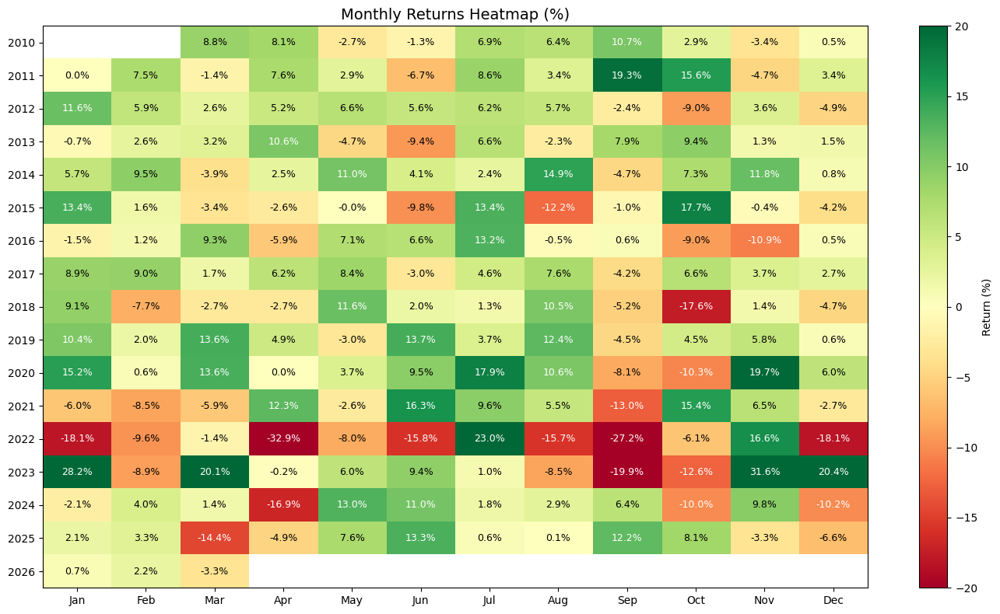

In [84]:
strategy_results['month'] = strategy_results.index.to_period('M')
monthly_rets = strategy_results.groupby('month')['portfolio_value'].last().pct_change() * 100

monthly_df = pd.DataFrame({
    'Year': monthly_rets.index.year, 'Month': monthly_rets.index.month,
    'Return': monthly_rets.values}).dropna()
heatmap_data = monthly_df.pivot(index='Year', columns='Month', values='Return')
heatmap_data.columns = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

fig, ax = plt.subplots(figsize=(14, 8))
im = ax.imshow(heatmap_data.values, cmap='RdYlGn', aspect='auto', vmin=-20, vmax=20)
ax.set_xticks(range(12)); ax.set_xticklabels(heatmap_data.columns)
ax.set_yticks(range(len(heatmap_data.index))); ax.set_yticklabels(heatmap_data.index)
for i in range(len(heatmap_data.index)):
    for j in range(12):
        val = heatmap_data.iloc[i, j]
        if not np.isnan(val):
            ax.text(j, i, f'{val:.1f}%', ha='center', va='center',
                    color='white' if abs(val) > 10 else 'black', fontsize=9)
ax.set_title('Monthly Returns Heatmap (%)', fontsize=14)
plt.colorbar(im, ax=ax, label='Return (%)')
plt.tight_layout()
plt.show()